# ASSESMENT ML II - ENSEMBLE LEARNING
In order to do this assignment, we were given two datasets: one of them contained data related to the solar energy used by solar plates in a certain region and the other one contained the solar irradiation. The solar energy used takes values between 0 and 1 and it is computed as the quotient of the solar energy produced by the sun and the potential solar energy that could be produced in the same region. The solar irradiation is the amount of solar energy that reaches the surface of the earth and it is measured in W/m^2. The goal of this assignment is to predict the solar energy used by the solar plates using the solar irradiation as the input variable. In order to do this, we will use ensemble learning techniques.

It is clear that solar irradiation varies depending on the time of the day, the season of the year, the weather, etc. Therefore, the solar energy used by the solar plates will also vary. In order to predict the solar energy used, we will use the solar irradiation as the input variable as well as time-dependent features such as the hour of the day, the day of the week, the month, etc. 

The dataset contains data from 2015 and 2020 for a certain region of spain. The data is collected for each 3 hour time period. The solar energy used in each time period is computed as the average of the solar energy used in each of the 3 hours of that specific time period. (We assume that the solar irradiation, which is also given in time periods of 3 hours, is computed in the same way). $$ UTIL_{Tramo\;h} = \frac{1}{3} \sum_{i=1}^{3} UTIL_{i}= \frac{UTIL_{h}+UTIL_{h+1}+UTIL_{h+2}}{3}  $$

We will start the assignment by loading the data and doing some exploratory data analysis. In the analysis we will include the following features: 
- We will include a time series plot of the solar energy used by the solar plates.
- We will include a correlation matrix of the features. 
- We will include a scatter plot of the solar energy used by the solar plates vs the solar irradiation.
- We will include a scatter plot of the solar energy used by the solar plates vs the hour of the day.
- We will include a scatter plot of the irradiation vs the hour of the day and month.

We will also look at null values and outliers in the data as well as the distribution of the target variable and the type of the features.

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

-----

## DATA PREPROCESSING
We will start the assignment by loading the data. Our output variable is the solar energy used by the solar plates but we noticed that it was given in a separate dataset where each column represented the utility of the solar plates for a given time range. As we are interested in predicting the solar energy used, we will need to pivot the data in order to have the solar energy used as the output variable. We will also need to create the time-dependent features that we mentioned before.

#### DF UTILIDAD

In [10]:
# Leemos los datos del dataset de utilidad
df_util = pd.read_csv('data/G06A_DATOS_UTIL.csv')
df_util.head()

,FECHA,UTILH00,UTILH03,UTILH06,UTILH09,UTILH12,UTILH15,UTILH18,UTILH21,ANNO,MES,DIA,DIASEM
0,2015-01-01,0.000003,0.000006,0.067728,0.611120,0.660956,0.164121,0.000059,1.142489e-06,2015,1,1,3
1,2015-01-02,0.000002,0.000007,0.064723,0.606449,0.669748,0.171284,0.000060,4.950785e-06,2015,1,2,4
2,2015-01-03,0.000003,0.000003,0.064551,0.603356,0.665159,0.172591,0.000064,7.616593e-07,2015,1,3,5
3,2015-01-04,0.000003,0.000006,0.065579,0.605925,0.668375,0.177143,0.000026,1.523319e-06,2015,1,4,6
4,2015-01-05,0.000002,0.000004,0.051313,0.498614,0.616564,0.158346,0.000015,3.046637e-06,2015,1,5,0


In [11]:
# Vamos a utilizar melt para poder poner todos los tramos horarios en una sola columna y ordenaermos por fecha y tramo
df_util_melted = df_util.melt(id_vars='FECHA')
df_util_melted

,FECHA,variable,value
0,2015-01-01,UTILH00,0.000003
1,2015-01-02,UTILH00,0.000002
2,2015-01-03,UTILH00,0.000003
3,2015-01-04,UTILH00,0.000003
4,2015-01-05,UTILH00,0.000002
...,...,...,...
26299,2020-12-27,DIASEM,6.000000
26300,2020-12-28,DIASEM,0.000000
26301,2020-12-29,DIASEM,1.000000
26302,2020-12-30,DIASEM,2.000000


In [12]:
df_util_melted['FECHA'] = pd.to_datetime(df_util_melted['FECHA'])
df_util_melted.sort_values(by=['FECHA', 'variable'], inplace=True)
df_util_melted.head(10)

,FECHA,variable,value
17536,2015-01-01,ANNO,2015.000000
21920,2015-01-01,DIA,1.000000
24112,2015-01-01,DIASEM,3.000000
19728,2015-01-01,MES,1.000000
0,2015-01-01,UTILH00,0.000003
2192,2015-01-01,UTILH03,0.000006
4384,2015-01-01,UTILH06,0.067728
6576,2015-01-01,UTILH09,0.611120
8768,2015-01-01,UTILH12,0.660956
10960,2015-01-01,UTILH15,0.164121


In [13]:
# Quitamos las variables que no nos interesan que son año, mes, día y día de la semana
# A esto tengo que darle una vuelta por que no estoy segura de que sea lo que quiero 
# Es que igual me conviene dejarlos para despues hacer el "join" de los dos datasets
df_util_melted = df_util_melted[(df_util_melted['variable'] != 'ANNO') & (df_util_melted['variable'] != 'DIA') & (df_util_melted['variable'] != 'DIASEM') & (df_util_melted['variable'] != 'MES')]
df_util_melted.head()

,FECHA,variable,value
0,2015-01-01,UTILH00,0.000003
2192,2015-01-01,UTILH03,0.000006
4384,2015-01-01,UTILH06,0.067728
6576,2015-01-01,UTILH09,0.611120
8768,2015-01-01,UTILH12,0.660956


In [17]:
# Pasamos la variable fecha a date time añadiendole la hora del tramo horario correspondiente
df_util_melted['FECHA'] = pd.to_datetime(df_util_melted['FECHA'].dt.strftime('%Y-%m-%d') + ' ' + df_util_melted['variable'].astype(str).str.split("H").str[1]+':00', format='%Y-%m-%d %H:%M')
df_util_melted.drop(columns=['variable'], inplace=True)
df_util_melted.head()

C:\Users\isaan\AppData\Local\Temp\ipykernel_8800\219287437.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_util_melted['FECHA'] = pd.to_datetime(df_util_melted['FECHA'].dt.strftime('%Y-%m-%d') + ' ' + df_util_melted['variable'].astype(str).str.split("H").str[1]+':00', format='%Y-%m-%d %H:%M')
C:\Users\isaan\AppData\Local\Temp\ipykernel_8800\219287437.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_util_melted.drop(columns=['variable'], inplace=True)


,FECHA,value
0,2015-01-01 00:00:00,0.000003
2192,2015-01-01 03:00:00,0.000006
4384,2015-01-01 06:00:00,0.067728
6576,2015-01-01 09:00:00,0.611120
8768,2015-01-01 12:00:00,0.660956


In [19]:
df_util_melted.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17536 entries, 0 to 17535
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   17536 non-null  datetime64[ns]
 1   value   17536 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 411.0 KB


As we can observe with the information displayed above, there are no null values so we can proceed.

 #### DF IRRADIACIÓN 

In [20]:
# Comenzamos cargando los datos de irradiación 
# Vemos que el dataset tiene la misma estructura que el de utilidad por lo que nos convendría hacer el mismo preprocesado
df_irrad = pd.read_csv('data/G06A_DATOS_IRRAD.csv')
df_irrad.head()

,FECHA,IRRADH00,IRRADH03,IRRADH06,IRRADH09,IRRADH12,IRRADH15,IRRADH18,IRRADH21,ANNO,MES,DIA,DIASEM
0,2015-01-01,0.0,0.0,0.0,760335.40,1565422.5,747611.06,0.0,0.0,2015,1,1,3
1,2015-01-02,0.0,0.0,0.0,757607.56,1558490.0,749262.44,0.0,0.0,2015,1,2,4
2,2015-01-03,0.0,0.0,0.0,763604.10,1573786.0,765404.60,0.0,0.0,2015,1,3,5
3,2015-01-04,0.0,0.0,0.0,766311.94,1581504.5,776130.10,0.0,0.0,2015,1,4,6
4,2015-01-05,0.0,0.0,0.0,712013.94,1521712.9,756035.60,0.0,0.0,2015,1,5,0


In [21]:
# Hacemos un melt para tener los tramos horarios en una sola columna y ordenamos por fecha y tramo
df_irrad_melted = df_irrad.melt(id_vars='FECHA')
df_irrad_melted['FECHA'] = pd.to_datetime(df_irrad_melted['FECHA'])
df_irrad_melted.sort_values(by=['FECHA', 'variable'], inplace=True)
df_irrad_melted.reset_index(drop=True, inplace=True)
df_irrad_melted.head(10)

,FECHA,variable,value
0,2015-01-01,ANNO,2015.00
1,2015-01-01,DIA,1.00
2,2015-01-01,DIASEM,3.00
3,2015-01-01,IRRADH00,0.00
4,2015-01-01,IRRADH03,0.00
5,2015-01-01,IRRADH06,0.00
6,2015-01-01,IRRADH09,760335.40
7,2015-01-01,IRRADH12,1565422.50
8,2015-01-01,IRRADH15,747611.06
9,2015-01-01,IRRADH18,0.00


In [22]:
# Vale, la idea ahora es quedarnos con un dataframe que tenga, para cada fecha y tramo, el valor de la irradiación y las variables derivadas de la fecha (estas serán nuestras variables independientes)
# Para ello, vamos a hacer un pivot de las variables ANNO, DIA, DIASEM y MES y luego concatenaremos el resto de variables
df_pivoted = df_irrad_melted[df_irrad_melted['variable'].isin(['ANNO', 'DIA', 'DIASEM', 'MES'])].pivot(index='FECHA', columns='variable', values='value').reset_index()
df_irrad = df_irrad_melted[~df_irrad_melted['variable'].isin(['ANNO', 'DIA', 'DIASEM','MES'])] 
result = pd.concat([df_pivoted, df_irrad]).sort_index().reset_index(drop=True)

In [23]:
# de nuevo ordenamos el resultaod por fecha y tramo
result.sort_values(by=['FECHA', 'variable'], inplace=True)
df_irrad

,FECHA,variable,value
3,2015-01-01,IRRADH00,0.00
4,2015-01-01,IRRADH03,0.00
5,2015-01-01,IRRADH06,0.00
6,2015-01-01,IRRADH09,760335.40
7,2015-01-01,IRRADH12,1565422.50
...,...,...,...
26298,2020-12-31,IRRADH09,737550.70
26299,2020-12-31,IRRADH12,1398824.50
26300,2020-12-31,IRRADH15,675842.75
26301,2020-12-31,IRRADH18,0.00


In [24]:
df_pivoted

variable,FECHA,ANNO,DIA,DIASEM,MES
0,2015-01-01,2015.0,1.0,3.0,1.0
1,2015-01-02,2015.0,2.0,4.0,1.0
2,2015-01-03,2015.0,3.0,5.0,1.0
3,2015-01-04,2015.0,4.0,6.0,1.0
4,2015-01-05,2015.0,5.0,0.0,1.0
...,...,...,...,...,...
2187,2020-12-27,2020.0,27.0,6.0,12.0
2188,2020-12-28,2020.0,28.0,0.0,12.0
2189,2020-12-29,2020.0,29.0,1.0,12.0
2190,2020-12-30,2020.0,30.0,2.0,12.0


In [25]:
# juntamos los dos datasets en función de2 la fecha 
df_irrad_merged = pd.merge(df_irrad, df_pivoted, on='FECHA')
df_irrad_merged

,FECHA,variable,value,ANNO,DIA,DIASEM,MES
0,2015-01-01,IRRADH00,0.00,2015.0,1.0,3.0,1.0
1,2015-01-01,IRRADH03,0.00,2015.0,1.0,3.0,1.0
2,2015-01-01,IRRADH06,0.00,2015.0,1.0,3.0,1.0
3,2015-01-01,IRRADH09,760335.40,2015.0,1.0,3.0,1.0
4,2015-01-01,IRRADH12,1565422.50,2015.0,1.0,3.0,1.0
...,...,...,...,...,...,...,...
17531,2020-12-31,IRRADH09,737550.70,2020.0,31.0,3.0,12.0
17532,2020-12-31,IRRADH12,1398824.50,2020.0,31.0,3.0,12.0
17533,2020-12-31,IRRADH15,675842.75,2020.0,31.0,3.0,12.0
17534,2020-12-31,IRRADH18,0.00,2020.0,31.0,3.0,12.0


In [26]:
# cambiamos el tipo de las variables a int
#  ¿las tenemos que tratar como categóricas? yo creo que si porque nos sirven para caracterizar las observaciones
df_irrad_merged[['ANNO', 'DIA', 'DIASEM', 'MES']] = df_irrad_merged[['ANNO', 'DIA', 'DIASEM', 'MES']].astype(int)

In [27]:
# al igual que antes añadimos la hora a la fecha para poder hacer el join con el dataset de utilidad y quitamos la columna variable que indicaba el tramo horario
df_irrad_merged['FECHA'] = pd.to_datetime(df_irrad_merged['FECHA'].dt.strftime('%Y-%m-%d') + ' ' + df_irrad_merged['variable'].astype(str).str.split("H").str[1]+':00', format='%Y-%m-%d %H:%M')
df_irrad_merged.drop(columns=['variable'], inplace=True)

In [28]:
# vamos a cambiar el nombre de la columna value a IRRAD para cuando hagamos el join con el dataset de utilidad
df_irrad_merged.rename(columns={"value": "IRRAD"}, inplace=True)
df_irrad_merged

,FECHA,IRRAD,ANNO,DIA,DIASEM,MES
0,2015-01-01 00:00:00,0.00,2015,1,3,1
1,2015-01-01 03:00:00,0.00,2015,1,3,1
2,2015-01-01 06:00:00,0.00,2015,1,3,1
3,2015-01-01 09:00:00,760335.40,2015,1,3,1
4,2015-01-01 12:00:00,1565422.50,2015,1,3,1
...,...,...,...,...,...,...
17531,2020-12-31 09:00:00,737550.70,2020,31,3,12
17532,2020-12-31 12:00:00,1398824.50,2020,31,3,12
17533,2020-12-31 15:00:00,675842.75,2020,31,3,12
17534,2020-12-31 18:00:00,0.00,2020,31,3,12


In [29]:
# cambiamos también el nombre de la columna value del dataset de utilidad a UTIL para que no haya problemas al hacer el join
df_util_melted.rename(columns={"value": "UTIL"}, inplace=True)

C:\Users\isaan\AppData\Local\Temp\ipykernel_8800\2984787476.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_util_melted.rename(columns={"value": "UTIL"}, inplace=True)


In [30]:
# el dataset final será el resultado de hacer un join entre los dos datasets por fecha y hora
dataset_final  = pd.merge(df_util_melted, df_irrad_merged, on='FECHA')
dataset_final

,FECHA,UTIL,IRRAD,ANNO,DIA,DIASEM,MES
0,2015-01-01 00:00:00,0.000003,0.00,2015,1,3,1
1,2015-01-01 03:00:00,0.000006,0.00,2015,1,3,1
2,2015-01-01 06:00:00,0.067728,0.00,2015,1,3,1
3,2015-01-01 09:00:00,0.611120,760335.40,2015,1,3,1
4,2015-01-01 12:00:00,0.660956,1565422.50,2015,1,3,1
...,...,...,...,...,...,...,...
17531,2020-12-31 09:00:00,0.473071,737550.70,2020,31,3,12
17532,2020-12-31 12:00:00,0.474931,1398824.50,2020,31,3,12
17533,2020-12-31 15:00:00,0.108857,675842.75,2020,31,3,12
17534,2020-12-31 18:00:00,0.000004,0.00,2020,31,3,12


In [31]:
# añadimos una columna TRAMO que será la hora del tramo horario - creo que caracteriza mejor las observaciones
dataset_final['TRAMO'] = dataset_final['FECHA'].dt.hour
dataset_final

,FECHA,UTIL,IRRAD,ANNO,DIA,DIASEM,MES,TRAMO
0,2015-01-01 00:00:00,0.000003,0.00,2015,1,3,1,0
1,2015-01-01 03:00:00,0.000006,0.00,2015,1,3,1,3
2,2015-01-01 06:00:00,0.067728,0.00,2015,1,3,1,6
3,2015-01-01 09:00:00,0.611120,760335.40,2015,1,3,1,9
4,2015-01-01 12:00:00,0.660956,1565422.50,2015,1,3,1,12
...,...,...,...,...,...,...,...,...
17531,2020-12-31 09:00:00,0.473071,737550.70,2020,31,3,12,9
17532,2020-12-31 12:00:00,0.474931,1398824.50,2020,31,3,12,12
17533,2020-12-31 15:00:00,0.108857,675842.75,2020,31,3,12,15
17534,2020-12-31 18:00:00,0.000004,0.00,2020,31,3,12,18


In [32]:
# esto es para asesgurarnoos de que no hay ningún valor nulo y que cada variable tiene el tipo correcto
dataset_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17536 entries, 0 to 17535
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   17536 non-null  datetime64[ns]
 1   UTIL    17536 non-null  float64       
 2   IRRAD   17536 non-null  float64       
 3   ANNO    17536 non-null  int32         
 4   DIA     17536 non-null  int32         
 5   DIASEM  17536 non-null  int32         
 6   MES     17536 non-null  int32         
 7   TRAMO   17536 non-null  int32         
dtypes: datetime64[ns](1), float64(2), int32(5)
memory usage: 753.6 KB


In [33]:
# casteamos las variables derivadas de la fecha a categóricas
dataset_final[['ANNO', 'DIA','DIASEM', 'MES', 'TRAMO']] = dataset_final[['ANNO', 'DIA','DIASEM', 'MES', 'TRAMO']].astype('category')

In [34]:
dataset_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17536 entries, 0 to 17535
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   FECHA   17536 non-null  datetime64[ns]
 1   UTIL    17536 non-null  float64       
 2   IRRAD   17536 non-null  float64       
 3   ANNO    17536 non-null  category      
 4   DIA     17536 non-null  category      
 5   DIASEM  17536 non-null  category      
 6   MES     17536 non-null  category      
 7   TRAMO   17536 non-null  category      
dtypes: category(5), datetime64[ns](1), float64(2)
memory usage: 498.6 KB


In [50]:
# aqui habria que terminar de hacer el EDA 
dataset_final.to_csv('data/dataset_final.csv')

## EXPLORATORY DATA ANALISIS EDA 

Once we have finished the data preprocessing, we will start the exploratory data analysis. We will include: 
- A time series plot of the solar energy used by the solar plates.
- A correlation matrix of the features. 
- A scatter plot of the solar energy used by the solar plates vs the solar irradiation.
- A scatter plot of the solar energy used by the solar plates vs the hour of the day.
- A scatter plot of the irradiation vs the hour of the day and month.

**Note**: As there are many observations in this dataset, we will in some cases create a function to plot the data depending on some conditions.

#### TIME SERIES OF THE UTILITY OF SOLAR ENERGY

In [35]:
# Esto es solo para que a la hora de plotear las leyendas sean más explicativas
meses = {1: 'Enero', 2: 'Febrero', 3: 'Marzo', 4: 'Abril', 5: 'Mayo', 6: 'Junio', 7: 'Julio', 8: 'Agosto', 9: 'Septiembre', 10: 'Octubre', 11: 'Noviembre', 12: 'Diciembre'}
diasemana = {1: 'Lunes', 2: 'Martes', 3: 'Miércoles', 4: 'Jueves', 5: 'Viernes', 6: 'Sábado', 0: 'Domingo'}

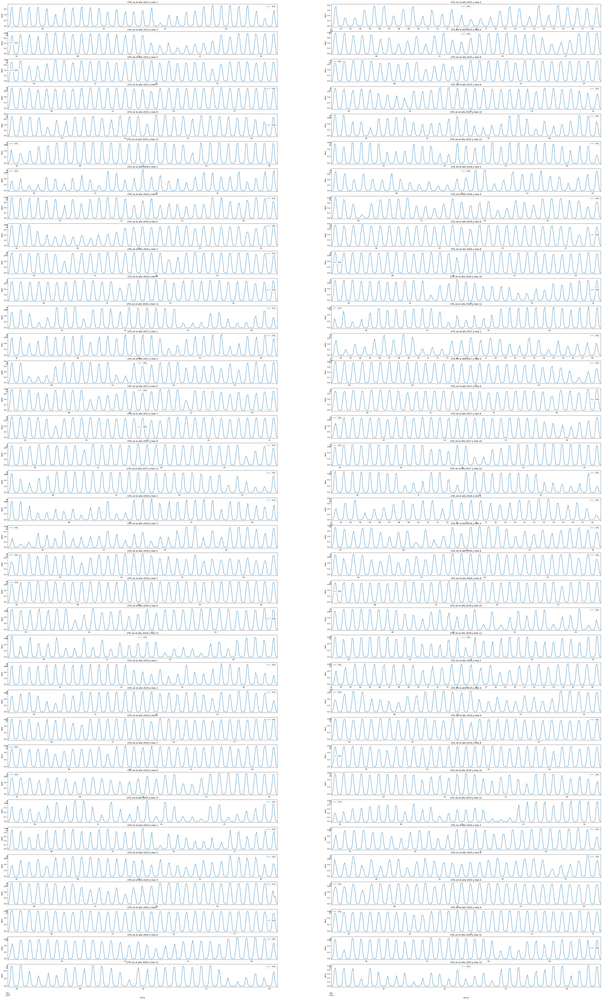

In [36]:
# esto es una chapuza que seguro vamos a tener que cambiar 
# no se exactamente cual es la mejor manera de plotearlo
# lo que me puede interesar aqui es
# - ver como cambia la irradiacion en función del mes
# - ver como cambia la utilidad en función del mes
# - ver como cambia la irradiacion en función del año
# - ver como cambia la utilidad en función del año

# def plot_year_month(df, year, month, value):
#     df_filtered = df[(df['FECHA'].dt.year == year)  & (df['FECHA'].dt.month == month)]
#     df_filtered.plot(x='FECHA', y=value, figsize=(60, 10), title = f'{value} en el año {year} y mes {month}', xlabel='Fecha', ylabel='Valor') 
#     plt.show()

fig, ax = plt.subplots(6*len(dataset_final['ANNO'].unique()), 2)
for i, year in enumerate(dataset_final['ANNO'].unique()):
    for j, month in enumerate(dataset_final['MES'].unique()):
        df_filtered = dataset_final[(dataset_final['FECHA'].dt.year == year)  & (dataset_final['FECHA'].dt.month == month)]
        if i == 0:            
            df_filtered.plot(x='FECHA', y='UTIL', figsize=(60, 100), title = f'UTIL en el año {year} y mes {month}', xlabel='Fecha', ylabel='Valor', ax=ax[j//2, j%2])
        else: 
            df_filtered.plot(x='FECHA', y='UTIL', figsize=(60, 100), title = f'UTIL en el año {year} y mes {month}', xlabel='Fecha', ylabel='Valor', ax=ax[6*i+ j//2, j%2])


plt.show()

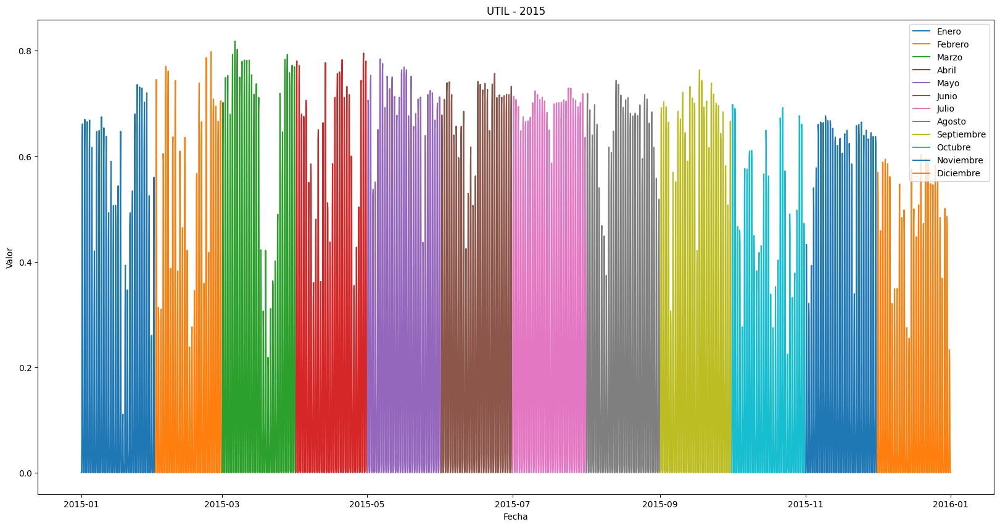

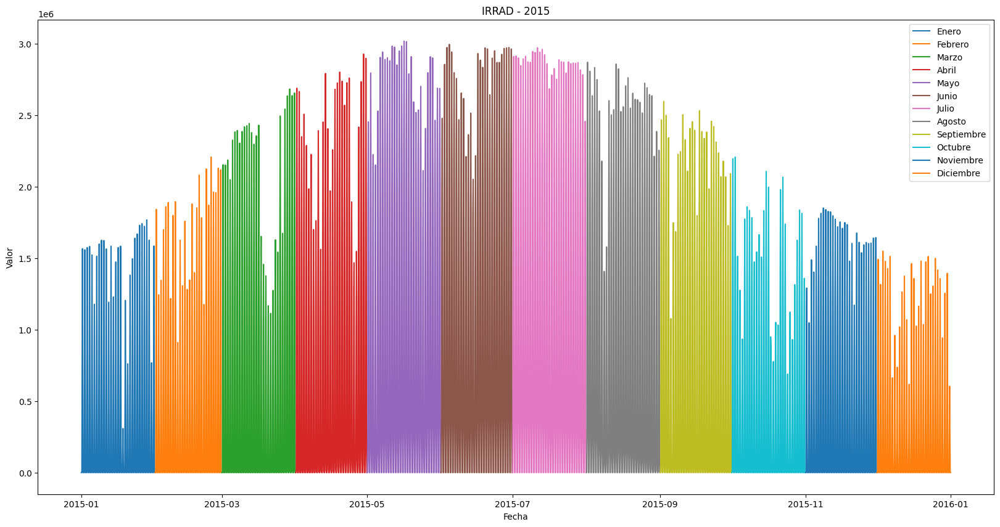

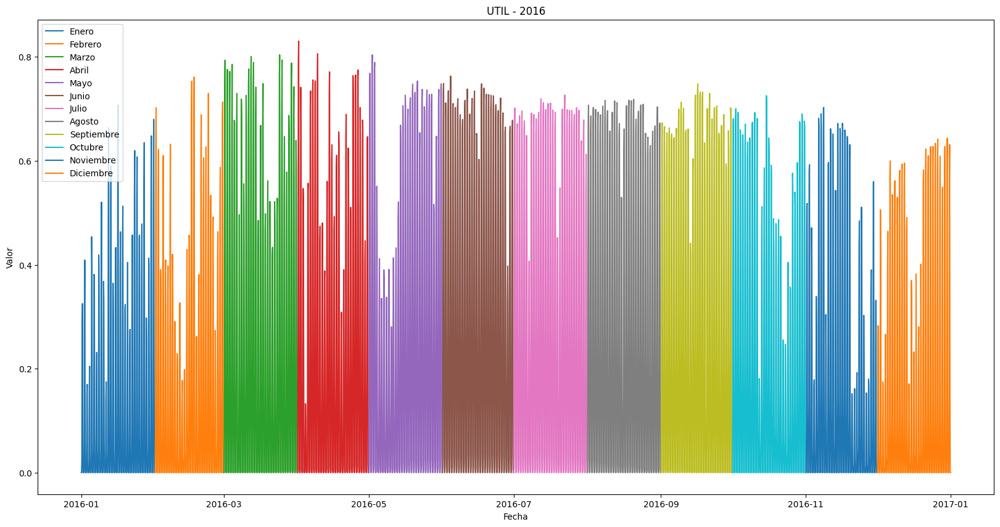

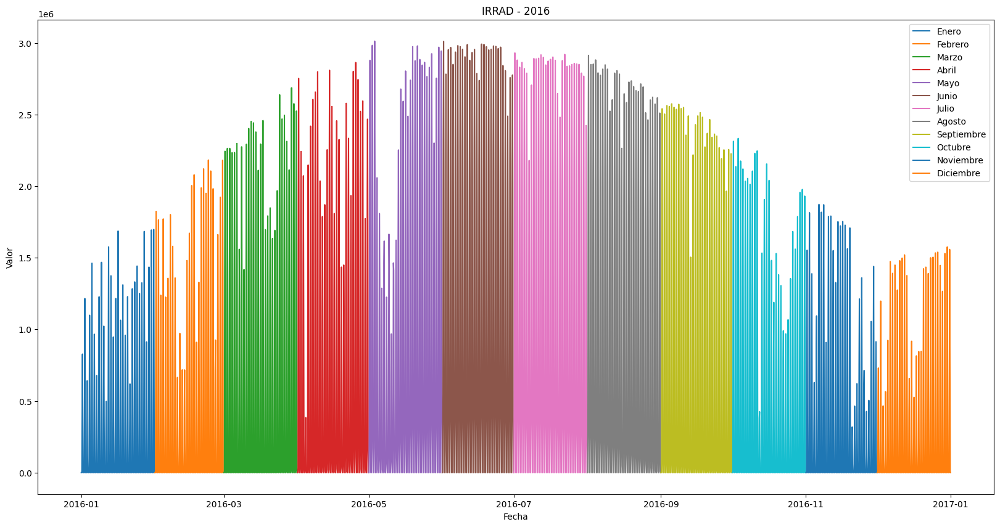

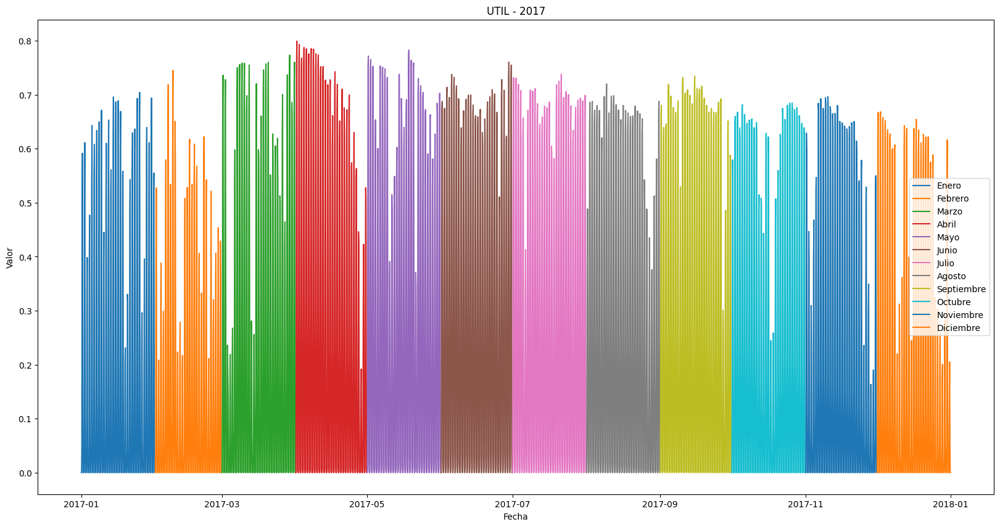

...

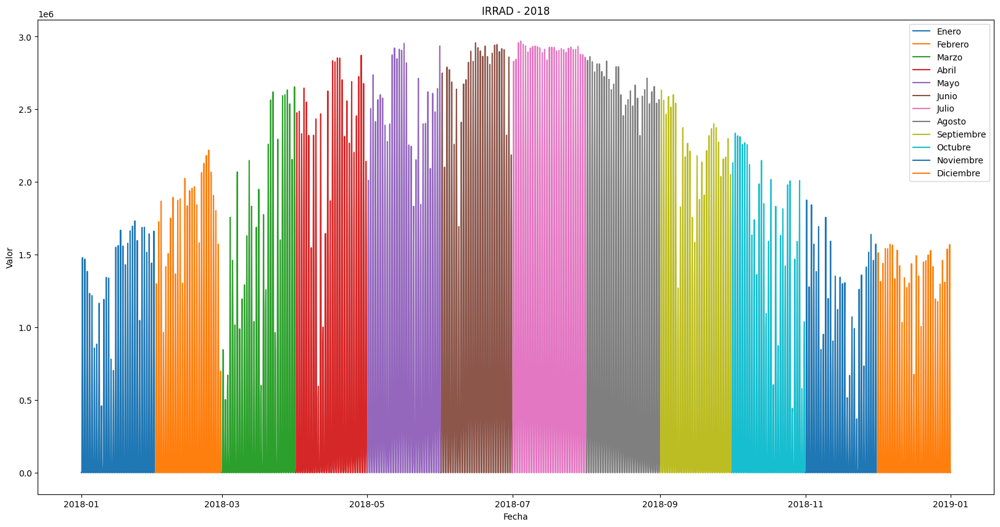

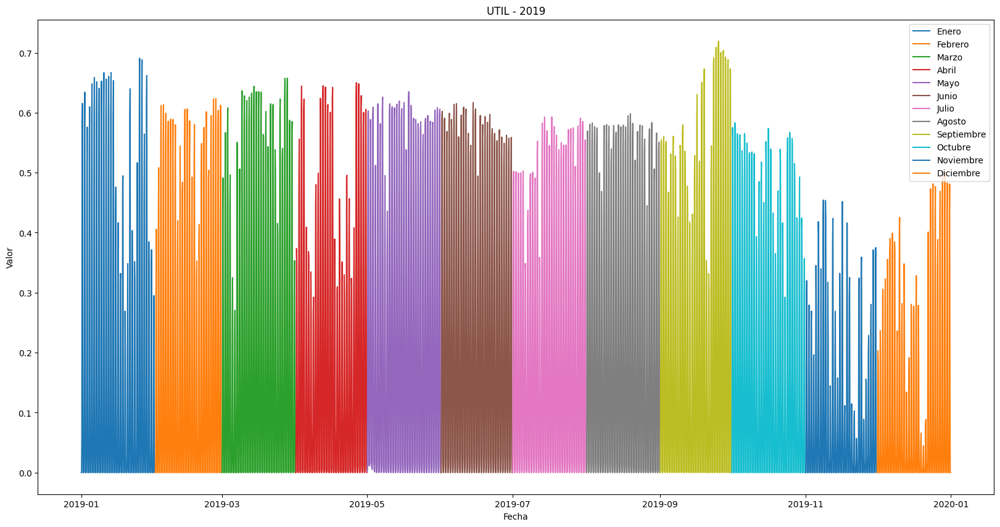

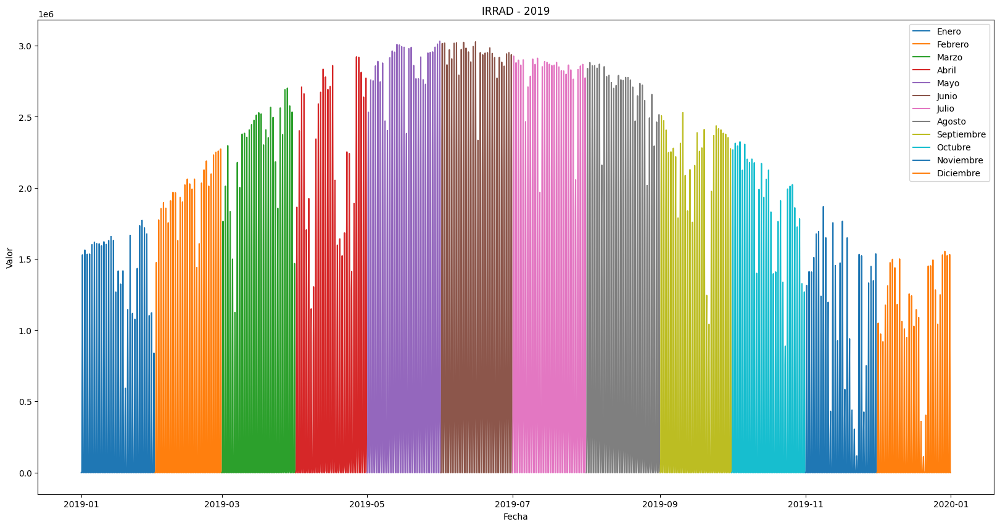

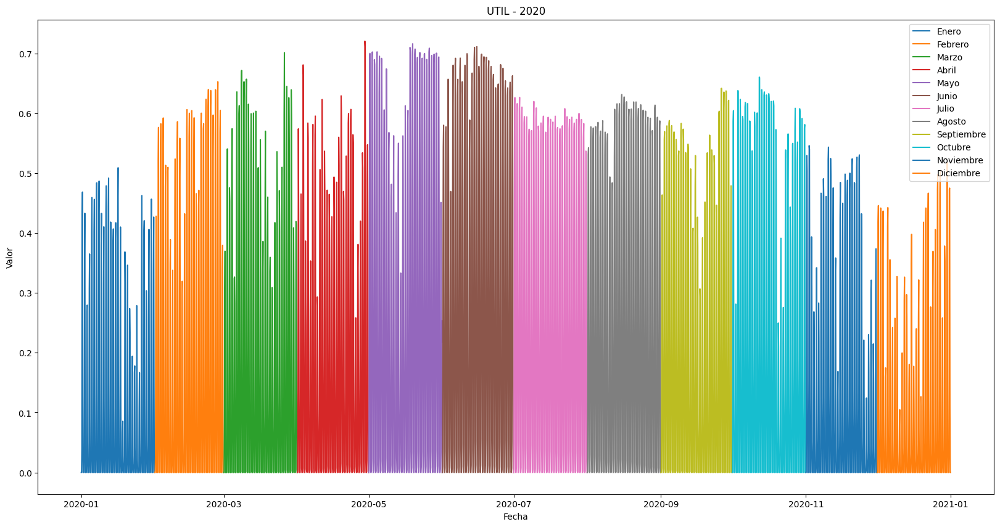

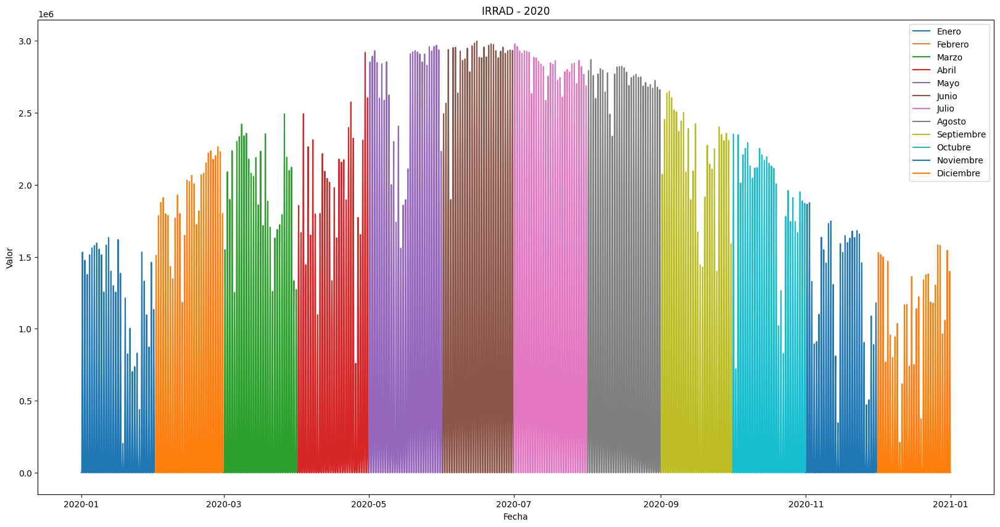

In [53]:
# Esta función nos sirve apra plotear, por colores según el mes, los valores de utilidad de un año	
def plot_year_month(df, year, value):
    df_filtered = df[df['FECHA'].dt.year == year]
    
    plt.figure(figsize=(20, 10))
    
    for month, data in df_filtered.groupby(df_filtered['FECHA'].dt.month):
        plt.plot(data['FECHA'], data[value], label=f'{meses[month]}')
    
    plt.xlabel('Fecha')
    plt.ylabel('Valor')
    plt.title(f'{value} - {year}')
    plt.legend()
    
    plt.show()

for i, year in enumerate(dataset_final['ANNO'].unique()):
    plot_year_month(dataset_final, year, 'UTIL')
    plot_year_month(dataset_final, year, 'IRRAD')

We can observe in the graph above that the utility of the solar energy used by the plates is extremely related to the irradiation, being higher  during the day and lower during the night.
We can also observe that the utility of the solar energy used by the plates is higher during the summer months and lower during the winter months. However, something that catches our eye is the fact that the utility of the solar energy used does not follow exactly the same pattern as the irradiation. During winter months, the irradiation is extremely low but the utility remains more or less the same (this difference is incredibly significant in 2017, 2018 and 2019). This could be because of external factor like the maintenance of the solar plates, the efficiency of the solar plates, etc.

#### DISTRIBUTION PLOTS 

We will now be looking at the distribution of the utility and the irradiation. We will also look at the distribution of the utility and the irradiation for each of the time-dependent features that we created. This will help us understand the relationship between the target variable and the input variables.

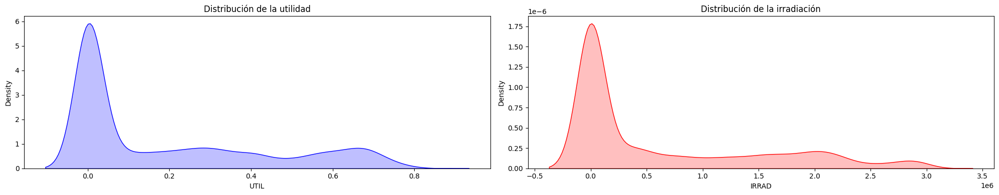

In [70]:
# quiero ver la distribución de la utilidad
fig, axs = plt.subplots(1, 2, figsize=(20, 4))

sns.kdeplot(dataset_final['UTIL'], color='blue', ax=axs[0], fill=True)
axs[0].set_title('Distribución de la utilidad')
sns.kdeplot(dataset_final['IRRAD'], color='red', ax=axs[1], fill=True)
axs[1].set_title('Distribución de la irradiación')

plt.tight_layout()
plt.show()
   

As we can observe in the graphs above, the distribution of the utility of the solar energy used by the plates is extremely similar to the distribution of the irradiation. This is expected as the utility of the solar energy used by the plates is computed as the quotient of the solar energy produced by the sun and the potential solar energy that could be produced in the same region. Therefore, we expect the utility of the solar energy used by the plates to be extremely related to the irradiation.

We will now do a boxplot of the solar energy used by the solar plates and the irradiation, depending on the different time variables to see which one has the most influence on the solar energy used by the solar plates. The bigger the diference in the distribution of the solar energy used by the solar plates, the most significant the variable is.

We will start looking at the distribution of the solar energy used by the solar plates depending on the time period of the day. This decision was made because we suppose that solar energy used by the plates as well as sun irradiation will vary significantly depending on the time of the day (at night time  there is no sun so we expect sun irradiation to be equal to zero and so the solar energy used by the plates).

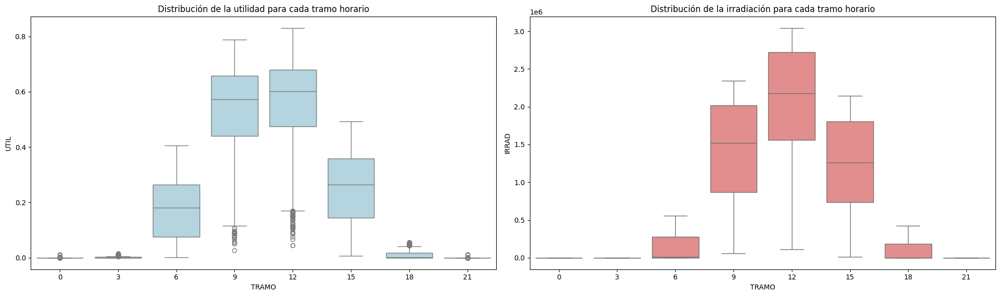

In [103]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6)) 
sns.boxplot(x='TRAMO', y='UTIL', data=dataset_final, color='lightblue', ax=axs[0])
axs[0].set_title('Distribución de la utilidad para cada tramo horario')


sns.boxplot(x='TRAMO', y='IRRAD', data=dataset_final, color='lightcoral', ax=axs[1])
axs[1].set_title('Distribución de la irradiación para cada tramo horario')

plt.tight_layout()
plt.show()

As expected, the utility is higher during the day than during the night. This is because the solar panels tend to generate higher amount of energy during the day as the sun radiates more energy during this time. Solar irradiation is higher during the day, especially in morning and afternoon hours and it is incredibly low during the night with values equal to 0. This is because the sun radiates more energy during the day than during the night. 

**Note** : One may notice looking at both graphs above that while solar irradiation is equal to 0 between 9 p.m and 6 a.m, the solar energy is not always equal to zero. This could be because solar energy is accumulated during the day and so the solar plates are able to generate energy during the night.

The next thing we will be looking at is the distribution of irradiation/solar energy used by the solar plates depending on the month. The year has four seasons: winter, spring, summer and autumn. We expect that the solar energy used by the solar plates will be higher during the summer and spring months than during the winter and autumn months. This is because the sun radiates more energy during the summer and spring months than during the winter and autumn months as the earth is closer to the sun during those months.

C:\Users\isaan\AppData\Local\Temp\ipykernel_19752\4231883941.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0].set_xticklabels([meses[x] for x in sorted(dataset_final['MES'].unique())])
C:\Users\isaan\AppData\Local\Temp\ipykernel_19752\4231883941.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1].set_xticklabels([meses[x] for x in sorted(dataset_final['MES'].unique())])


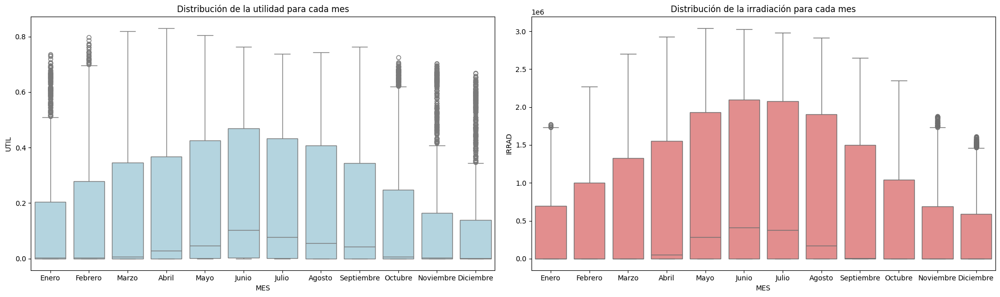

In [102]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6)) 
sns.boxplot(x='MES', y='UTIL', data=dataset_final, color='lightblue', ax=axs[0])
axs[0].set_title('Distribución de la utilidad para cada mes')
axs[0].set_xticklabels([meses[x] for x in sorted(dataset_final['MES'].unique())]) 


sns.boxplot(x='MES', y='IRRAD', data=dataset_final, color='lightcoral', ax=axs[1])
axs[1].set_title('Distribución de la irradiación para cada mes')
axs[1].set_xticklabels([meses[x] for x in sorted(dataset_final['MES'].unique())]) 

plt.tight_layout()
plt.show()

The next thing we will be looking at is the distribution of the utility and irradiation values for each day of the week. We suppose that this variable will not be as relevant as the time of the day or the month but we will still look at it. 

C:\Users\isaan\AppData\Local\Temp\ipykernel_19752\3081465635.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0].set_xticklabels([diasemana[x] for x in sorted(dataset_final['DIASEM'].unique())])
C:\Users\isaan\AppData\Local\Temp\ipykernel_19752\3081465635.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1].set_xticklabels([diasemana[x] for x in sorted(dataset_final['DIASEM'].unique())])


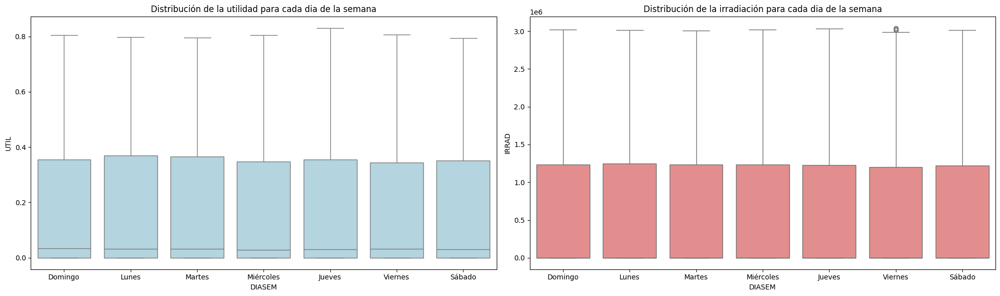

In [109]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6)) 
sns.boxplot(x='DIASEM', y='UTIL', data=dataset_final, color='lightblue', ax=axs[0])
axs[0].set_title('Distribución de la utilidad para cada dia de la semana')
axs[0].set_xticklabels([diasemana[x] for x in sorted(dataset_final['DIASEM'].unique())]) 


sns.boxplot(x='DIASEM', y='IRRAD', data=dataset_final, color='lightcoral', ax=axs[1])
axs[1].set_title('Distribución de la irradiación para cada dia de la semana')
axs[1].set_xticklabels([diasemana[x] for x in sorted(dataset_final['DIASEM'].unique())]) 

plt.tight_layout()
plt.show()

After plotting the distribution depending on the week day, we pressume that when building the model, this feature will not be as important as the others as the distribution of the solar energy used by the solar plates and sun irraciation are very similar for each day of the week.

Finally, we will be looking at the distribution of both variables depending on the year. Due to factors like climate change, we expect to see a difference in the distribution of the solar energy used by the solar plates and the solar irradiation between 2015 and 2020. 

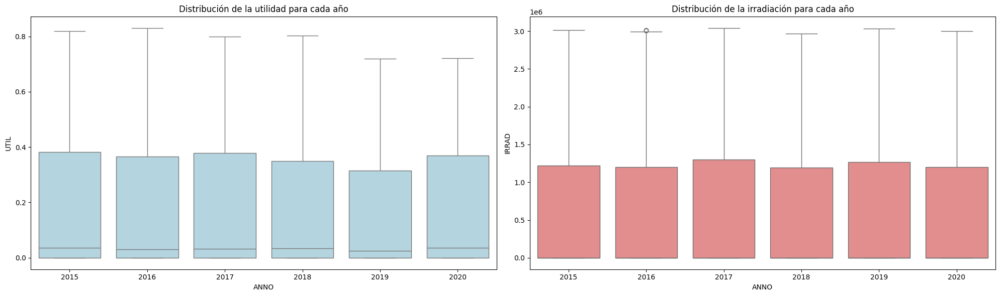

In [111]:
fig, axs = plt.subplots(1, 2, figsize=(20, 6)) 
sns.boxplot(x='ANNO', y='UTIL', data=dataset_final, color='lightblue', ax=axs[0])
axs[0].set_title('Distribución de la utilidad para cada año')


sns.boxplot(x='ANNO', y='IRRAD', data=dataset_final, color='lightcoral', ax=axs[1])
axs[1].set_title('Distribución de la irradiación para cada año')

plt.tight_layout()
plt.show()

#### UTILITY AND IRRADIATION

We will now be looking at or two numeric variables: irradiation and utility. The aim of this assignment is to use solar irradiation as well as time-dependent features to predict the solar energy used by the solar plates. We have already looked at the dependency of the solar energy used by the solar plates on the time-dependent features. We will now look at the dependency of the solar energy used by the solar plates on the solar irradiation.

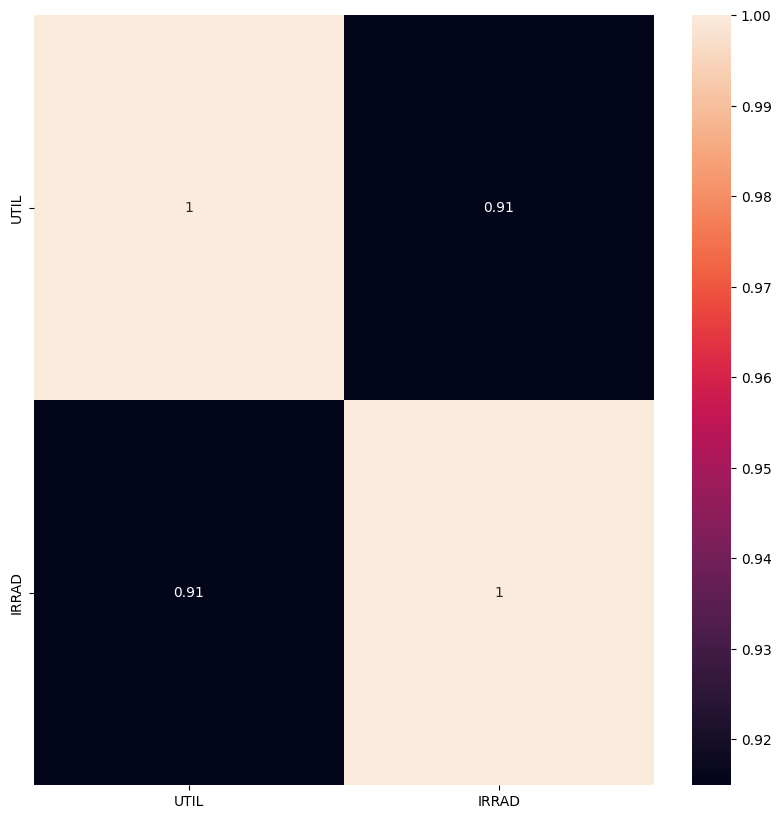

In [114]:
# Vamos a ver la correlación entre las variables 

plt.figure(figsize=(10, 10))
numeric_variables = dataset_final.select_dtypes(include=['float'])
sns.heatmap(numeric_variables.corr(), annot=True)
plt.show()


As we can observe in the correlation matrix, the solar energy used by the solar plates is highly correlated with the solar irradiation. We will now plot the solar energy used by the solar plates vs the solar irradiation to see if there is a linear relationship between the two variables.

<Axes: xlabel='IRRAD', ylabel='UTIL'>

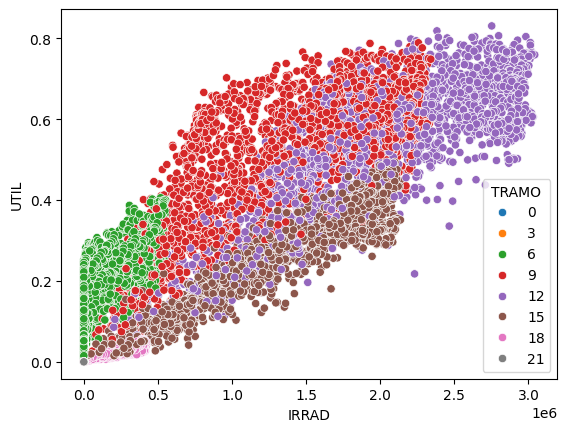

In [122]:
# Esto lo pongo junto con la correlación para ver que hay una clara relación lineal entre la utilidad y la irradiación
sns.scatterplot(x='IRRAD', y='UTIL', data=dataset_final, hue='TRAMO')

#### LINEAR REGRESSION

As we could observe in the scatter plot above, there is a linear relationship between the solar energy used by the solar plates and the solar irradiation. We will now fit a linear regression model to the data to see how well the model fits the data. We will also look at the coefficients of the model to see which variables are the most important in predicting the solar energy used by the solar plates.

In [145]:
# Machine learning libraries
import math
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.compose import ColumnTransformer

from sklearn import set_config
set_config(display='diagram')

# others
from statsmodels.stats.outliers_influence import variance_inflation_factor
from mltools import regression_tools as RT
from mltools.regression_tools import LinearRegressor
from mltools import model_tools as MT

In [155]:
INPUTS = dataset_final.columns[(dataset_final.columns != 'UTIL') & (dataset_final.columns != 'FECHA')]
OUTPUT = 'UTIL'

# We have categorical inputs with many classes. We will create dummy variables automatically after
X = dataset_final[INPUTS]
y = dataset_final[OUTPUT]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  #percentage of test data
                                                    random_state=0) #seed for replication
X_train.head()
## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['UTIL'] = y_train
dfTS_eval = X_test.copy()
dfTS_eval['UTIL'] = y_test

In [156]:
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_LR_NUM = ["IRRAD"]
INPUTS_LR_CAT = ["ANNO","MES","DIASEM","DIA","TRAMO"]
INPUTS_LR = INPUTS_LR_NUM + INPUTS_LR_CAT

# Prepare the numeric variables by imputing by scaling
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])

# Prepare the categorical variables by encoding the categories
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore',drop='first'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(transformers=[
        ('num', numeric_transformer, INPUTS_LR_NUM),
        ('cat', categorical_transformer, INPUTS_LR_CAT)
        ])

pipe = Pipeline(steps=[('Prep',preprocessor), # Preprocess the variables when training the model 
                        ('LinReg',LinearRegressor())]) 


# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
param = {}
LR_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                        param_grid=param, # Defined grid to search in
                        n_jobs=-1, # Number of cores to use (parallelize)
                        cv=nFolds) # Number of Folds 
LR_fit.fit(X_train[INPUTS_LR], y_train) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('Prep',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          StandardScaler())]),
                                                                         ['IRRAD']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('onehot',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         ['ANNO',
                                                                          'MES',
                                                                          'DIASEM',
                                                                          'DIA',
                                                                          'TRAMO'])])),
                                       ('LinReg', LinearRegressor())]),
             n_jobs=-1, param_grid={})

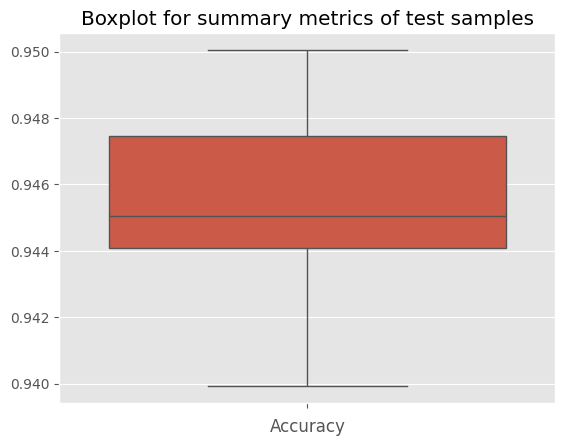

In [157]:
cv_errors = np.empty([nFolds,len(LR_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR4 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors.reshape(-1)).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()

In [158]:
LR_fit.best_estimator_['LinReg'].summary(LR_fit.best_estimator_['Prep'].get_feature_names_out())

                            OLS Regression Results                            
Dep. Variable:                   UTIL   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     4063.
Date:                Fri, 29 Mar 2024   Prob (F-statistic):               0.00
Time:                        10:04:36   Log-Likelihood:                 20364.
No. Observations:               14028   AIC:                        -4.061e+04
Df Residuals:                   13967   BIC:                        -4.015e+04
Df Model:                          60                                         
Covariance Type:            nonrobust                                         
var                       coef            std err         t               P>|t|          
---------------------------------------------------------------------------
num__IRRAD                0.148           0.

In [159]:
dfTR_eval['LR_pred'] = LR_fit.predict(X_train)
dfTS_eval['LR_pred'] = LR_fit.predict(X_test)
#Training and test MAE - Mean Absolute error
print('Training MAE:',mean_absolute_error(dfTR_eval['UTIL'], dfTR_eval['LR_pred']))
print('Test MAE:',mean_absolute_error(dfTS_eval['UTIL'], dfTS_eval['LR_pred']))
#Training and test RMSE - Root Mean Square Error
print('Training RMSE:',math.sqrt(mean_squared_error(dfTR_eval['UTIL'], dfTR_eval['LR_pred'])))
print('Test RMSE:',math.sqrt(mean_squared_error(dfTS_eval['UTIL'], dfTS_eval['LR_pred'])))
#Training and test r^2 
print('Training R2:',r2_score(dfTR_eval['UTIL'], dfTR_eval['LR_pred']))
print('Test R2:',r2_score(dfTS_eval['UTIL'], dfTS_eval['LR_pred']))
#Analysis of residuals

Training MAE: 0.036960055771289094
Test MAE: 0.03799980074992931
Training RMSE: 0.0566647445829123
Test RMSE: 0.058753710097688226
Training R2: 0.9458097763952403
Test R2: 0.9426280386230752


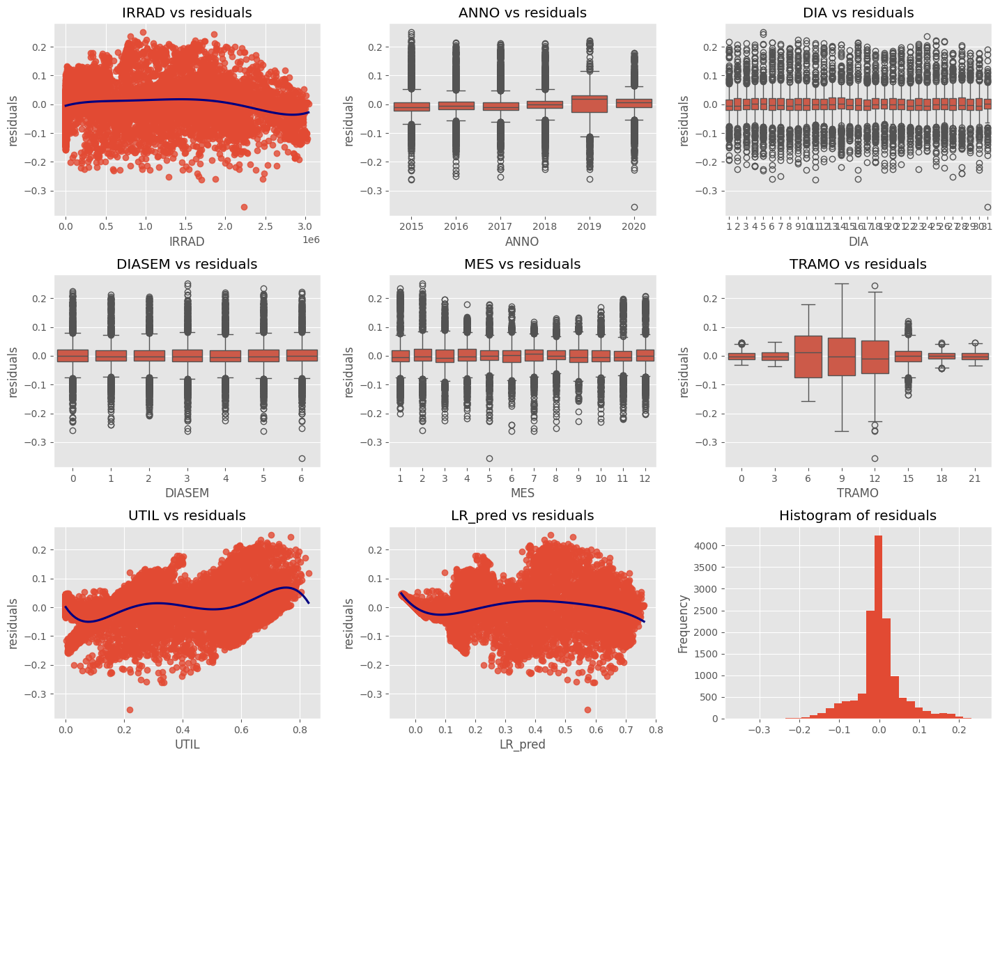

In [160]:
RT.plotModelDiagnosis(dfTR_eval, 'LR_pred', 'UTIL',figsize=[15,15])

The linear regression model has a R^2 value of 0.95 in both training and test dataset which means that the model explains 95% of the variance in the data. This is a very good result. The coefficients of the model are also very high which means that the model is able to predict the solar energy used by the solar plates very well. The most important variable in predicting the solar energy used by the solar plates is the solar irradiation. This is expected as the solar energy used by the solar plates is computed as the quotient of the solar energy produced by the sun and the potential solar energy that could be produced in the same region. Therefore, we expect the solar energy used by the solar plates to be highly related to the solar irradiation.

Looking at the residuals of the model, we can observe that the residuals are higher when estimating the peaks of utility. This could be because, as we mentioned before, the irradiation does not follow exactly the same pattern as the utility being low in winter months in 2017, 2018 and 2019 while the utility remains the same. This could be because of external factors like the maintenance of the solar plates, the efficiency of the solar plates, etc and would explain the higher residuals when estimating the peaks of utility.

#### CONCLUSION
In the model to build we will expect to the irradiation to be the most significant variable. Due to its incredibly high correlation with the utility of the solar energy used by the plates, we expect to obtain a precise model with the irradiation explaining most of the variance of the utility of the solar energy used by the plates. We will also include the time-dependent features that we created as we saw that they also have an influence on the utility of the solar energy used by the plates.We will expect the time of the day to be another significant variable as the utility of the solar energy used by the plates is higher during the day than during the night where it reaches values equal to zero. We will also expect the month to be a significant variable as the utility of the solar energy used by the plates is higher during the summer and spring months than during the winter and autumn months. On the contrary, we will not expect the day of the week or the year to be significant variables as the distribution of the utility of the solar energy used by the plates and the solar irradiation is very similar for each day of the week and for each year.